In [1]:
import wandb
wandb.login(key="7d4c1bebcd0b61443751b134012d9f66a4b5ae38")

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: samamostafa507 (samamostafa507-faculty-of-computers-and-artificial-intel). Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [2]:
# Step 1: Install dependencies
!pip install -q git+https://github.com/huggingface/diffusers.git
!pip install -q -r https://raw.githubusercontent.com/huggingface/diffusers/main/examples/text_to_image/requirements_sdxl.txt
!pip install -q "peft>=0.15.0"
!pip install -q accelerate transformers ftfy datasets wandb

# Step 2: Clone diffusers repository
!git clone https://github.com/huggingface/diffusers.git /kaggle/working/diffusers

# Step 3: Import libraries
import pandas as pd
import os
import shutil
from datasets import Dataset
#  Set accelerate defaults
!accelerate config default

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.3/168.3 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 411.1/411.1 kB 7.5 MB/s eta 0:00:00:00:01
Cloning into '/kaggle/working/diffusers'...
remote: Enumerating objects: 91305, done.
remote: Counting objects: 100% (1002/1002), done.
remote: Compressing objects: 100% (450/450), done.
remote: Total 91305 (delta 833), reused 568 (delta 547), pack-reused 90303 (from 2)
Receiving objects: 100% (91305/91305), 67.70 MiB | 31.14 MiB/s, done.
Resolving deltas: 100% (67049/67049), done.
accelerate configuration saved at /root/.cache/huggingface/accelerate/default_config.yaml


In [4]:
# Step 4: Load and preprocess dataset
df = pd.read_parquet("hf://datasets/AdamLucek/oldbookillustrations-small/data/train-00000-of-00001.parquet")
print(df.shape)
df.head()

(1000, 2)


,image,text
0,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,A bald man with a long beard smiles faintly as...
1,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,Dante stumbles against the traitor Bocca degli...
2,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,View of the Arno at Florence with a section of...
3,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,Terracotta vase with foliated ornaments and fi...
4,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,A family can be seen next to a holy water basi...


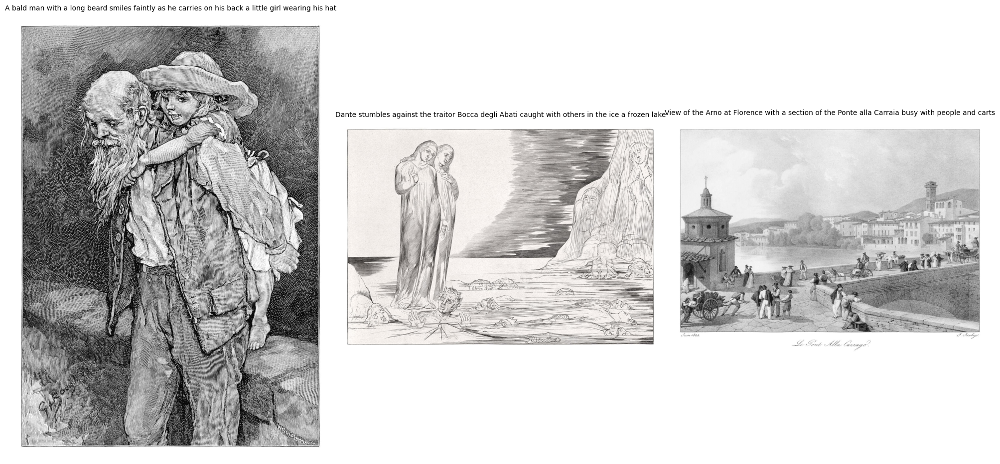

In [7]:
import matplotlib.pyplot as plt
from PIL import Image
import io

def show_data(df):
    plt.figure(figsize=(20, 10))
    for idx in range(3):
        # Extract image bytes
        img_bytes = df.iloc[idx]['image']['bytes']
        # Convert bytes to image
        image = Image.open(io.BytesIO(img_bytes)).convert('RGB')
        # Extract caption
        caption = df.iloc[idx]['text']
        # Plot the image
        plt.subplot(1, 3, idx + 1)
        plt.imshow(image)
        plt.title(caption, fontsize=10)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Call the function
show_data(df)

In [8]:
import torch
import gc
torch.cuda.empty_cache()
gc.collect()

30

In [9]:
# Run training with accelerate on a single GPU
!accelerate launch --num_processes=2 /kaggle/working/diffusers/examples/text_to_image/train_text_to_image_lora_sdxl.py \
  --pretrained_model_name_or_path="stabilityai/stable-diffusion-xl-base-1.0" \
  --pretrained_vae_model_name_or_path="madebyollin/sdxl-vae-fp16-fix" \
  --dataset_name="AdamLucek/oldbookillustrations-small" \
  --caption_column="text" \
  --image_column="image" \
  --validation_prompt "A girl in the garden" \
  --num_validation_images=1 \
  --validation_epochs=1 \
  --output_dir="/kaggle/working/art-sdxl-trained-model" \
  --resolution=512 \
  --center_crop \
  --random_flip \
  --train_batch_size=16 \
  --num_train_epochs=3 \
  --checkpointing_steps=500 \
  --gradient_accumulation_steps=1 \
  --learning_rate=1e-04 \
  --lr_warmup_steps=0 \
  --report_to="wandb" \
  --dataloader_num_workers=4 \
  --allow_tf32 \
  --mixed_precision="fp16" \
  --gradient_checkpointing 

2025-05-10 15:46:41.133780: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-10 15:46:41.133808: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-10 15:46:41.385526: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-10 15:46:41.385539: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-10 15:46:41.454802: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new
No LoRA keys associated to CLIPTextModelWithProjection found with the prefix='text_encoder_2'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModelWithProjection related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


  0%|          | 0/50 [00:00<?, ?it/s]

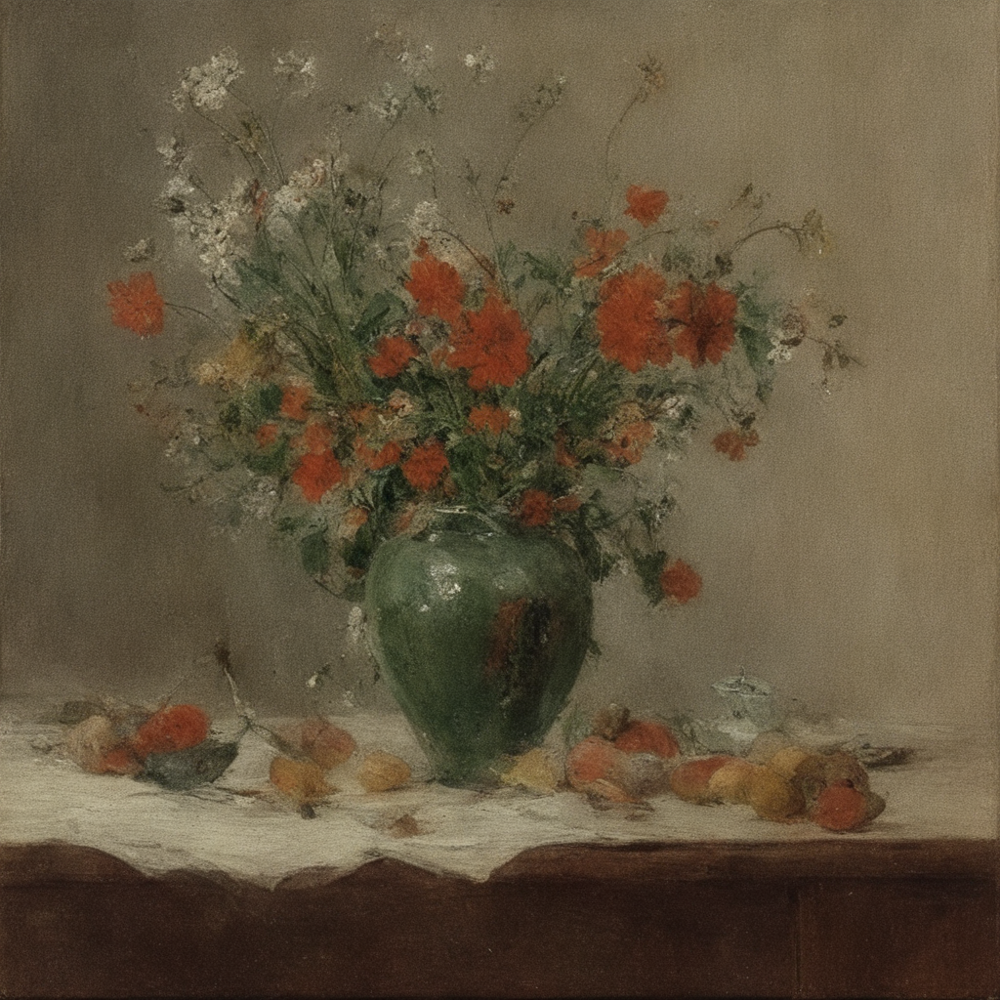

In [10]:
from diffusers import StableDiffusionXLPipeline
import torch

# Load the pipeline with the pretrained model and LoRA weights
pipeline = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    use_safetensors=True
)
pipeline.load_lora_weights("/kaggle/working/art-sdxl-trained-model/pytorch_lora_weights.safetensors")
pipeline = pipeline.to("cuda")

# Generate an image
image = pipeline("Table with a vase").images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

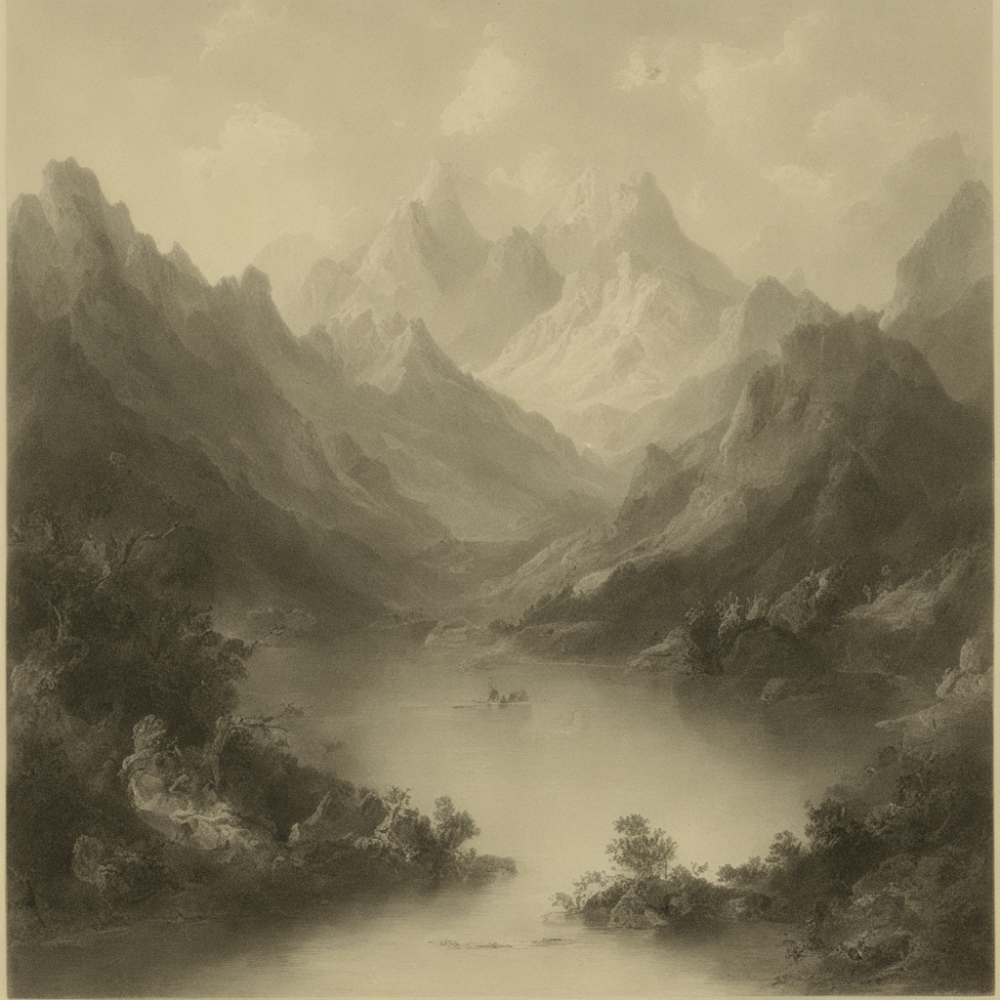

In [15]:
# Generate an image
image = pipeline("mountains and a lake").images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

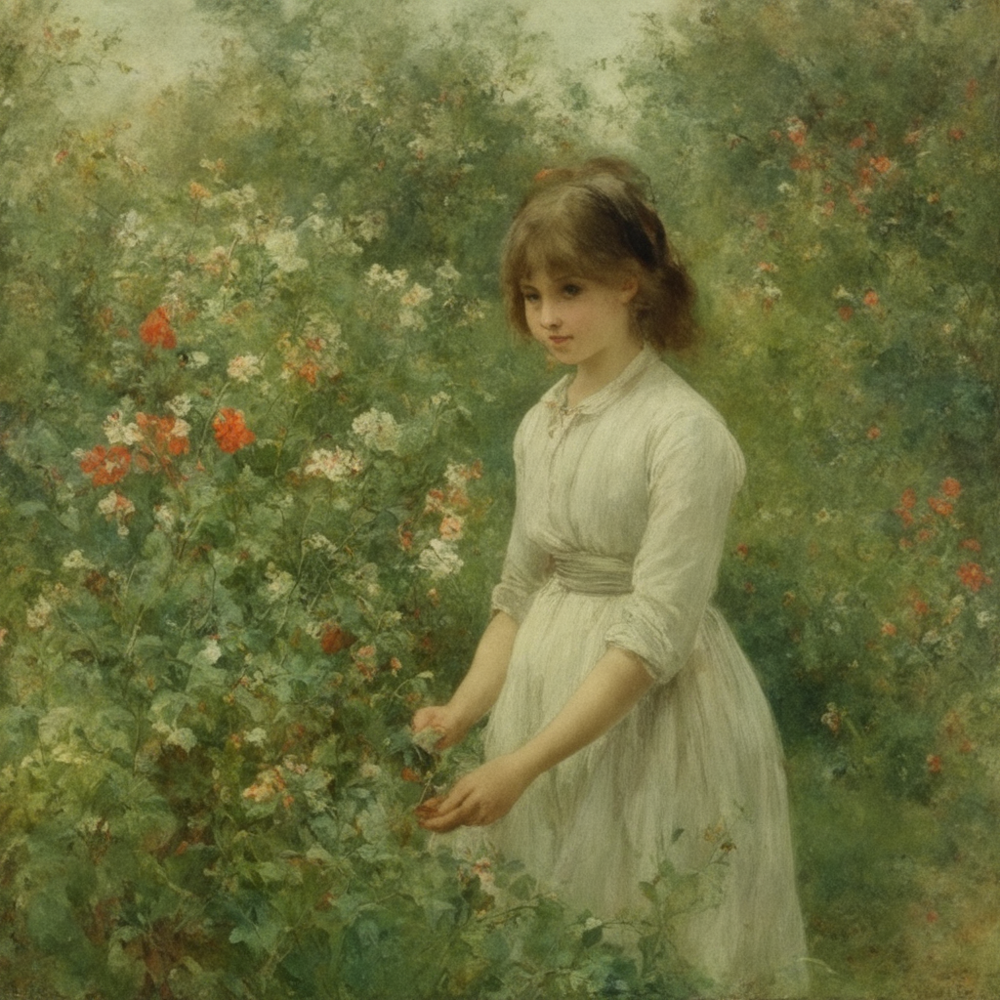

In [12]:
image = pipeline("A girl in the garden").images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

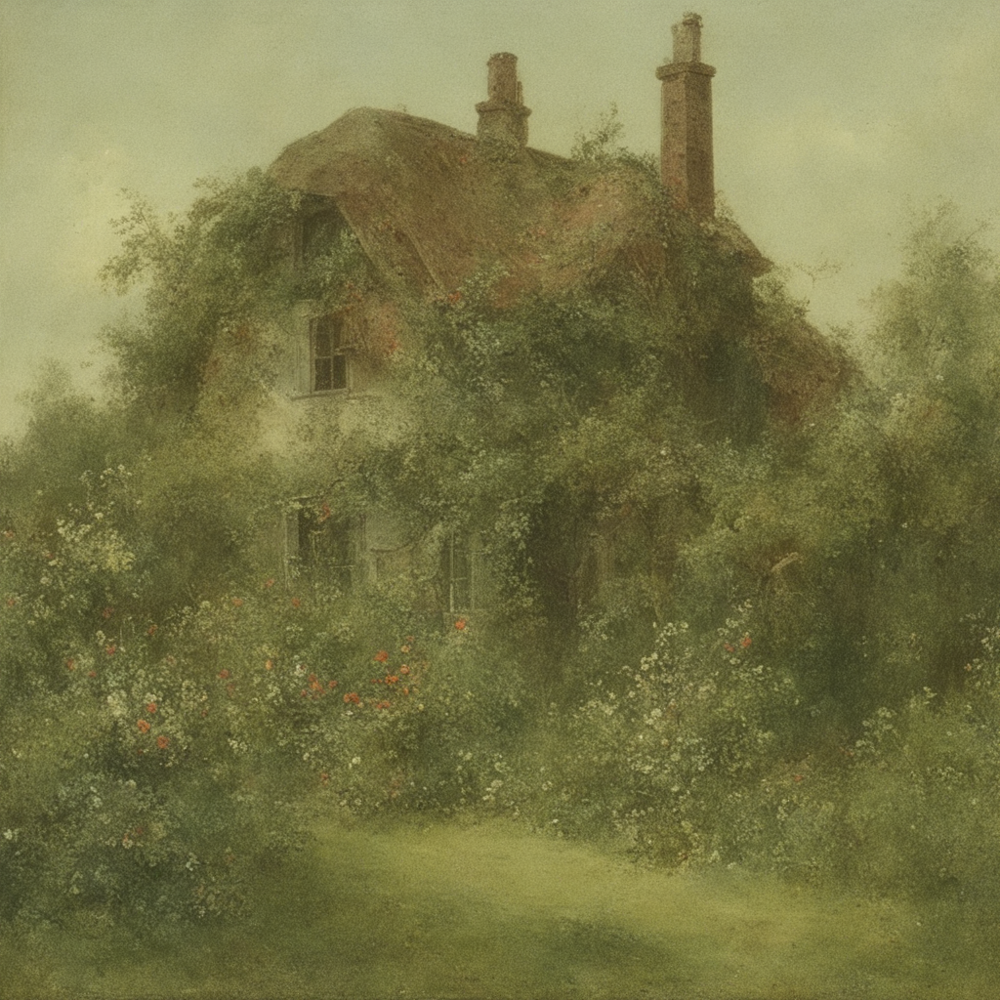

In [17]:
# Generate an image
image = pipeline("house with a garden").images[0]
image